# Recommendations Systems
## Assignment 1: Matrix Factorization 

**By:**  

Gil Zeevi <br>
Gil Ayache


**The goal of this assignment is to:**
- Understand the details of matrix factorization algorithm
- Practice recommender system training and evaluation.

**Instructions:**
- Students will form teams of two people each, and submit a single homework for each team.
- The same score for the homework will be given to each member of the team.
- Your solution in the form of an Jupyter notebook file (with extension ipynb).
- Images/Graphs/Tables should be submitted inside the notebook.
- The notebook should be runnable and properly documented. 
- Please answer all the questions and include all your code.
- English only.

**Submission:**
- Submission of the homework will be done via Moodle by uploading a Jupyter notbook.
- The homwork needs to be entirely in English.
- The deadline for submission is on Moodle.

**Requirements:**  
- Python 3.6 should be used.  
- You should implement the matrix factorization algorithm by yourself using only basic Python libraries (such as numpy).



<br><br><br><br>

**Grading:**
- Q1 - 0 points - Data exploration
- Q2 - 30 points - Evaluation Metrics
- Q3 - 25 points - Model Implementation & Evaluation
- Q4 - 20 points - Train & HyperParams Search 
- Q5 - 15 points - Final Thoughts
- Q6 - 10 points - Similarity & Explainability 

`Total: 100`

**Prerequisites**

In [1]:
!pip install --quiet zipfile36

**Imports**

In [2]:
# general
import time
import random
import zipfile
import requests
import warnings

# ml
import numpy as np
import scipy as sp
import pandas as pd

# visual
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

# metrics - do not use these metrics, but you can use them to check your work
from sklearn.metrics import mean_squared_error,ndcg_score 
pd.options.display.float_format = '{:.5f}'.format
# notebook
from IPython.display import FileLink, display

**Hide Warnings**

In [3]:
warnings.filterwarnings('ignore')

**Disable Autoscrolling**

In [4]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

**Set Random Seed**

In [5]:
random.seed(123)

# Question 1: 
## Data exploration 

Download the MovieLens 100K rating dataset.   
Calculate the dataset sparsity, distribution of number of ratings as well as the average rating value per user\item.  
Include additional exploration you find relevant to questions 2 and 3.  
Discuss your insights and possible challenges related to the prediction task described in question 2.  

In [6]:
url = 'http://files.grouplens.org/datasets/movielens/ml-100k.zip'
zip_name = 'ml-100k.zip'
data_dir = 'ml-100k/'

r = requests.get(url, allow_redirects=True)
open(zip_name, 'wb').write(r.content)

with zipfile.ZipFile(zip_name,"r") as zip_ref:
    zip_ref.extractall()

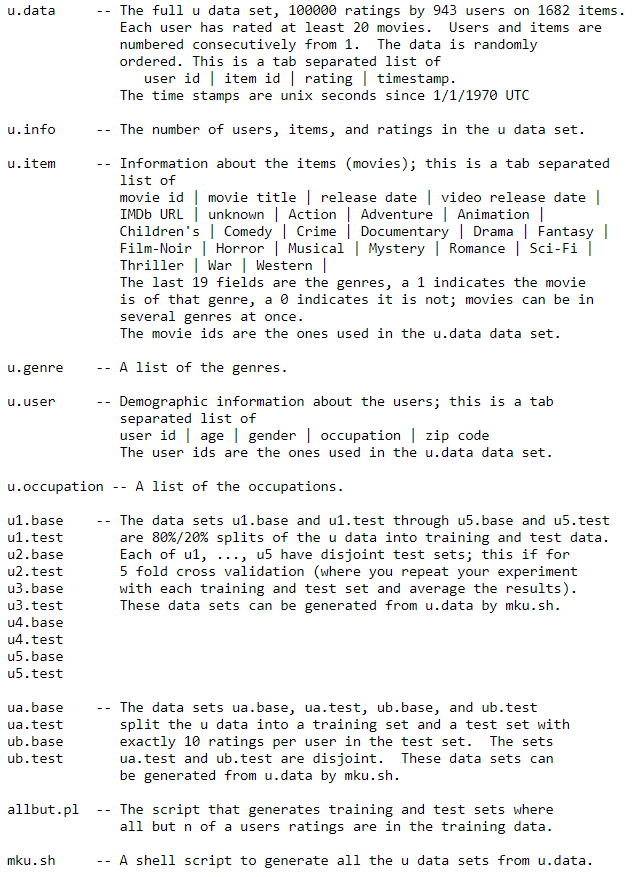

**Columns Names**

In [7]:
cols_data = ['user_id','item_id','rating','timestamp']
cols_user = ['user_id','age','gender','occupation','zip code']
cols_item = ['movie id','movie_title','release_date','video_release_date','IMDb_URL','unknown','Action','Adventure','Animation',
             'Childrens','Comedy','Crime','Documentary','Drama','Fantasy','Film_Noir','Horror','Musical','Mystery','Romance',
             'Sci_Fi','Thriller','War','Western']

**Read users data file**

In [8]:
df_users = pd.read_csv(data_dir + 'u.user',delimiter='|', header=None,names=cols_user)
df_users.shape

(943, 5)

**Read items(movies) data file**

In [9]:
df_items = pd.read_csv(data_dir + 'u.item',delimiter='|', header=None,names=cols_item,encoding="ISO-8859-1")
df_items.shape

(1682, 24)

**Read rating data file**

In [10]:
df_ratings = pd.read_csv(data_dir + 'u.data',delimiter='\t', header=None,names=cols_data)
df_ratings.shape

(100000, 4)

Making sure shapes are mathing the info data file

In [11]:
open(data_dir + 'u.info').readlines()

['943 users\n', '1682 items\n', '100000 ratings\n']

### Matrix:

In [12]:
ratings = df_ratings.pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
ratings.head()

item_id,1,2,3,4,5,6,7,8,9,10,...,1673,1674,1675,1676,1677,1678,1679,1680,1681,1682
user_id,,,,,,,,,,,,,,,,,,,,,
1,5.00000,3.00000,4.00000,3.00000,3.00000,5.00000,4.00000,1.00000,5.00000,3.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2,4.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,2.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
3,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
4,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
5,4.00000,3.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000


In [13]:
df_ratings

,user_id,item_id,rating,timestamp
0,196,242,3,881250949
1,186,302,3,891717742
2,22,377,1,878887116
3,244,51,2,880606923
4,166,346,1,886397596
...,...,...,...,...
99995,880,476,3,880175444
99996,716,204,5,879795543
99997,276,1090,1,874795795
99998,13,225,2,882399156


<br><br><br><br>

**Explore ratings data:**

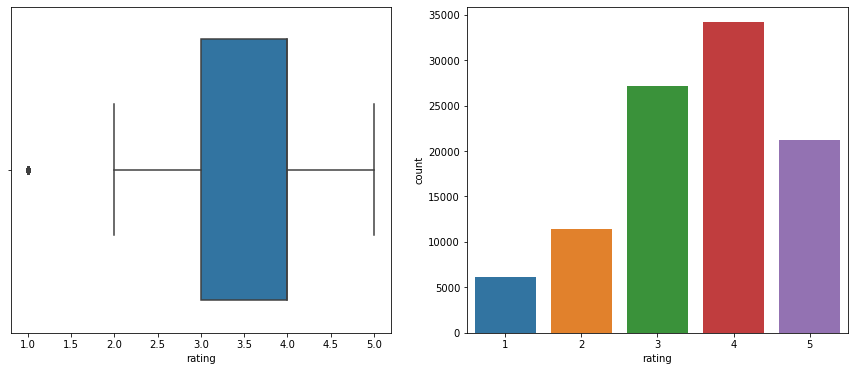

In [14]:
f, axes = plt.subplots(1, 2,figsize=(15,6))
sns.boxplot(df_ratings.rating,ax=axes[0])
sns.countplot(df_ratings.rating,ax=axes[1])
plt.show()

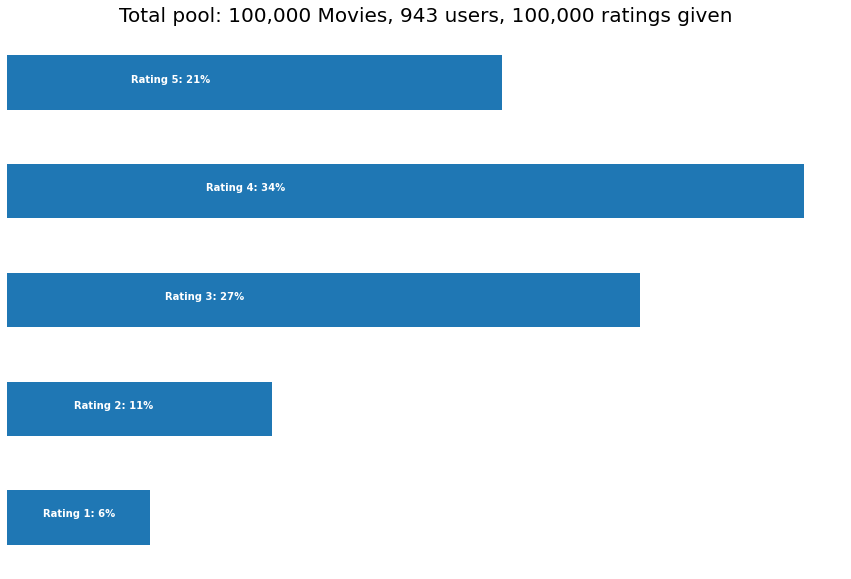

In [15]:
p = df_ratings.groupby('rating')['rating'].agg(['count'])
movie_count = df_ratings.item_id.count()
cust_count = df_ratings.user_id.nunique() 
rating_count = df_ratings.user_id.count()

ax = p.plot(kind = 'barh', legend = False, figsize = (15,10))
plt.title('Total pool: {:,} Movies, {:,} users, {:,} ratings given'.format(movie_count, cust_count, rating_count), fontsize=20)
plt.axis('off')

for i in range(1,6):
    ax.text(p.iloc[i-1][0]/4, i-1, 'Rating {}: {:.0f}%'.format(i, p.iloc[i-1][0]*100 / p.sum()[0]), color = 'white', weight = 'bold')

**Distribution of number of ratings per user\item**

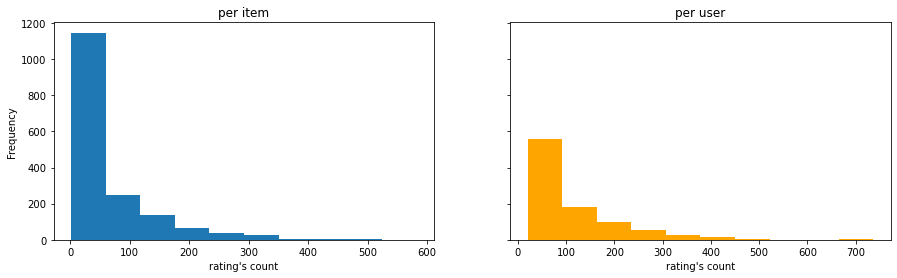

In [16]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(15, 4))

ratings.astype(bool).sum(axis=0).plot.hist(ax=ax[0])
ratings.astype(bool).sum(axis=1).plot.hist(ax=ax[1],color='orange')
ax[0].set_title('per item')
ax[1].set_title('per user')
ax[0].set_xlabel('rating\'s count')
ax[1].set_xlabel('rating\'s count');

**Distribution of average rating value  per user\item**

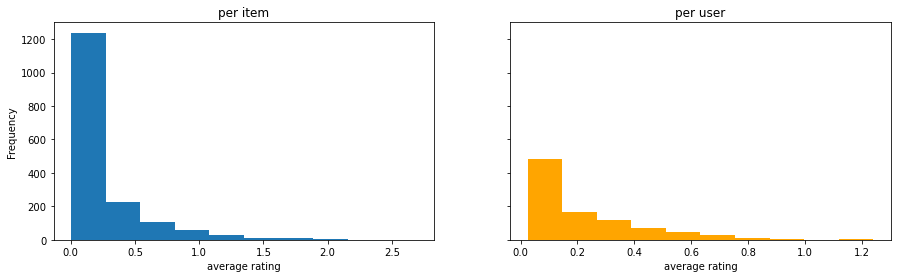

In [17]:
fig, ax = plt.subplots(1, 2, sharex='col', sharey='row', figsize=(15, 4))

ratings.mean(axis=0).plot.hist(ax=ax[0])
ratings.mean(axis=1).plot.hist(ax=ax[1],color='orange')
ax[0].set_title('per item')
ax[1].set_title('per user')
ax[0].set_xlabel('average rating')
ax[1].set_xlabel('average rating');

**Movie ratings aggregated by user**

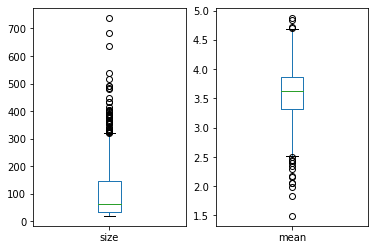

In [18]:
userRatingsAggr = df_ratings.groupby(['user_id']).agg({'rating': [np.size, np.mean]})
userRatingsAggr.reset_index(inplace=True)  # To reset multilevel (pivot-like) index
userRatingsAggr['rating'].plot(kind='box', subplots=True)
plt.show();

**Genres**

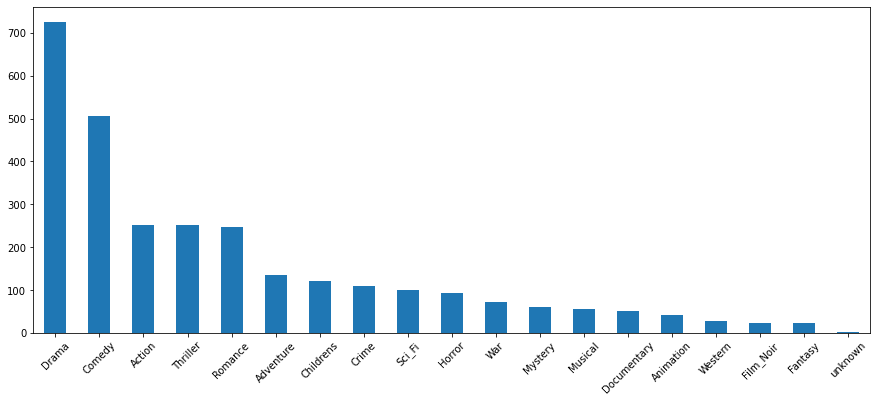

In [19]:
plt.figure(figsize=(15,6))
df_items.iloc[:,5:].sum().sort_values(ascending=False).plot.bar()
plt.xticks(rotation=45)
plt.show();

**Calculate the dataset sparsity:**

$$
Density  = \frac{\text{number of nonzero ratings in the matrix}}{\text{number of users}\times\text{number of items}} 
\quad \qquad
Sparcity = 1 - \frac{\text{number of nonzero ratings in the matrix}}{\text{number of users}\times\text{number of items}}
$$

In [20]:
matrix_sparsity =  round((1-np.count_nonzero(ratings)/ratings.size)*100,2)
print('Sparsity is equal to {}%'.format(str(matrix_sparsity)) )

Sparsity is equal to 93.7%


<br><br><br><br><br>
# Question 2:
# Evaluation Metrics

Please create a class to calculate the following metrics on two different dataset (df_true,df_pred):
- RMSE
- MRR
- nDCG

**Notes:**
- Please read this great blog post: 
<a href='https://medium.com/swlh/rank-aware-recsys-evaluation-metrics-5191bba16832'>MRR vs MAP vs NDCG: Rank-Aware Evaluation Metrics And When To Use Them </a>
- Please consider edge cases - NaN, Null, Zeros, out of bound, eval time, etc.
- You can work with Dataframe or with Numpy arrays(matrix)
- You may remove/add params to these functions
- Please use only pytonic code!

In [21]:
class my_metrics():
        
    def RMSE(df_true,df_pred,lower_bound=1,upper_bound=5):
        if type(df_pred) == type(np.array([1])):
            if type(df_true) ==type(pd.DataFrame()):
                df_true = df_true.values
            df_pred[df_pred > upper_bound] = upper_bound
            df_pred[df_pred < lower_bound] = lower_bound
            flag =  df_true != 0
            s_e = ((df_true-df_pred) * flag)**2
            return np.sqrt(s_e.sum()/ flag.sum())
        flag =  df_true.values != 0 # a flag vector which if multiplies, gives score to non zero values
        s_e = ((df_true.values-df_pred.values) * flag)**2
        return np.sqrt(s_e.sum()/ flag.sum())
    
    def MRR(df_true,df_pred,lower_bound=1,upper_bound=5,top_n=5,threshold=3,MF = False):
        # please use MRR_for_user
        if MF: # if the prediction arrived from matrix factorization method -> fix it with bounds
            df_pred[df_pred > upper_bound] = upper_bound
            df_pred[df_pred < lower_bound] = lower_bound
        zero_counter = 0
        counter = 0
        for r in df_pred.index:# sum the Reciprocal Ranks
            rr = my_metrics.MRR_for_user(df_true.loc[r],df_pred.loc[r],lower_bound,upper_bound,top_n,threshold)
            if not rr: zero_counter+=1
            counter+= rr
        if (len(df_true) - zero_counter) == 0:
            return 0
        return counter / (len(df_true) - zero_counter) #return the mean Reciprocal Ranks
        

    def MRR_for_user(user_true: pd.Series,user_pred: pd.Series,lower_bound=1,upper_bound=5,top_n=5,threshold=3):
        act = user_true[user_true >0]
        pr = user_pred.loc[act.index].reset_index(drop=True).nlargest(top_n)
        if not pr.size: #rating has faild to be predicted
            return 0
        if pr.nlargest(1).values[0] < threshold: #faild to predict high rating
            return 0
        pr = pr[pr > 0]
        act = act.reset_index(drop=True).loc[pr.index]
        if act.nlargest(1).values[0] < threshold:
            return 0
        return 1 / (pr.isin(pr.loc[act.nlargest(1).index]).reset_index(drop=True).nlargest(1).index[0] + 1)   
    
    
    def NDCG(df_true,df_pred,lower_bound=1,upper_bound=5,top_n=5,MF = False):
        # please use NDCG_for_user
        if MF: # if the prediction arrived from matrix factorization method -> fix it with bounds
            df_pred[df_pred > upper_bound] = upper_bound
            df_pred[df_pred < lower_bound] = lower_bound
        zero_counter = 0   
        counter = 0
        for r in df_pred.index:# apply Discounted Cumulative Gain for each user and sum it
            dcg, ndcg = my_metrics.NDCG_for_user(df_true.loc[r],df_pred.loc[r],lower_bound,upper_bound,top_n)
            if (ndcg == 0): zero_counter+=1
            counter+= 0 if (ndcg == 0) else (dcg / ndcg)
        if (len(df_true) - zero_counter) == 0:
            return 0
        return counter / (len(df_true) - zero_counter) #return the mean NDCG
        
    def NDCG_for_user(user_true: pd.Series,user_pred: pd.Series,lower_bound=1,upper_bound=5,top_n=5):
        # please use DCG function
        user_true = user_true[user_true >0]
        user_pred = user_pred.loc[user_true.index]
        idx = user_pred.nlargest(top_n).index
        rel = user_true.loc[idx]
        rel_ideal = user_true.loc[idx].sort_values(ascending = False)
        dcg, ndcg = my_metrics.DCG(rel),my_metrics.DCG(rel_ideal)
        return dcg, ndcg
    
    def DCG(rel: pd.Series):
        # please implement the DCG formula
        rel.reset_index(drop = True,inplace = True) 
        return (rel/ np.log2(rel.index +2)).sum()
        
    def get_error(df_true,df_pred):        
        return {'RMSE':my_metrics.RMSE(df_true,df_pred,),'MRR_5':my_metrics.MRR(df_true,df_pred,top_n=5),'MRR_10':my_metrics.MRR(df_true,df_pred,top_n=10),'NDCG_5':my_metrics.NDCG(df_true,df_pred,top_n=5),'NDCG_10':my_metrics.NDCG(df_true,df_pred,top_n=10)}


Sanity check which was presented in class - result should be 1/3

In [22]:
my_metrics.MRR_for_user(pd.Series([1,0,0,4,1,0,0,0,0]),pd.Series([3,2,3,2,5,0.5,0.5,1,1]),lower_bound=1,upper_bound=5,top_n=5,threshold=3)

0.3333333333333333

Checking your evaltuation metrics and performence:

In [23]:
%time my_metrics.get_error(ratings,ratings)

Wall time: 7.39 s


{'RMSE': 0.0, 'MRR_5': 1.0, 'MRR_10': 1.0, 'NDCG_5': 1.0, 'NDCG_10': 1.0}

<br><br><br><br>

# Question 3
# Model Implementation & Evaluation 

**Save final results**

In [24]:
final_results = pd.DataFrame(columns=['Method','Time','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10'])

**Choose fold**

In [25]:
df_folds = {i:
       {'train' : pd.read_csv('{}u{}.base'.format(data_dir,i), delimiter='\t', header=None, names=cols_data),
        'test'  : pd.read_csv('{}u{}.test'.format(data_dir,i), delimiter='\t', header=None, names=cols_data)
       } for i in range(1,6)} 

def fold2df(i):
    train = df_folds[i]['train'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    test  = df_folds[i]['test'].pivot(index = 'user_id', columns ='item_id', values = 'rating').fillna(0)
    return train,test 

def getfulldf(train_fold,test_fold):
    train = ratings.copy()
    train[:] = 0
    test = train.copy()
    
    train.loc[train_fold.index,train_fold.columns] = train_fold.values
    test.loc[test_fold.index,test_fold.columns] = test_fold.values
    return train,test

fold = 1
train,test = getfulldf(*fold2df(1))

train.shape,test.shape

((943, 1682), (943, 1682))

### Popularity model

Recommend the most popular movies which have more then 10 ratings.

Use the RMSE, MRR and NDCG metrics to evaluate your recommender system.   
For the MRR and NDCG metrics use cutoff values of 5 and 10.   

In [26]:
class POP():

    def __init__(self,df_train,M=10):
    # df is the set to train on
    # N is the number of movies to recommend
    # M is the minimum votes required to be listed in the chart
        self.df_train = df_train
        self.min_movie_ratings = M
        self.recommended = ratings.copy()
        self.recommended[:] = 0
        self.fit_time = 0
        self.movies_ind = None

       
    def fit(self):
        # please record the training time in fit_time
        t = time.time()
        rel_df = self.df_train.loc[:,((self.df_train > 0).sum(axis = 0) >= self.min_movie_ratings)]
        rec_films = rel_df[rel_df>0].mean().sort_values(ascending = False) # a series with the mean rating and the movie's id
        self.movies_ind = rec_films.index
        self.recommended.loc[:,rec_films.index] = rec_films.values #using Numpy broadcasting to fill the rating for each movie
        self.fit_time = time.time() - t
        
    def predict(self,N=10):
        return self.movies_ind[:N]
        
        
    def get_rmse(self,test):
        # please use my_metrics
        actual = test[test > 0].dropna(how='all').fillna(0) 
        pred = self.recommended.reindex(index = actual.index , columns = actual.columns)  
        # GET THE TOTAL FIT RMSE , without filtering to N prediction
        return my_metrics.RMSE(actual,pred)
    
    def get_mrr(self,test,k=10,threshold=3):
        # Please use my_metrics
        pred = self.recommended.loc[:,self.predict(k)] # use the prediction
        actual = test.loc[:,self.predict(k)]
        actual = actual[actual > 0].dropna(how='all').fillna(0) # filter all none relevant test with no ratings whatsoever
        pred = pred.reindex(index = actual.index , columns = actual.columns) # use the corresponding indices to the prediction also
        return my_metrics.MRR(actual,pred,k,threshold)
    
    def get_ndcg(self,test,k=5):
        # please use my_metrics
        pred = self.recommended.loc[:,self.predict(k)]
        actual = test.loc[:,self.predict(k)]
        actual = actual[actual > 0].dropna(how='all').fillna(0)
        pred = pred.reindex(index = actual.index , columns = actual.columns)
        return my_metrics.NDCG(actual,pred,top_n = k)
    
    # this is just a quick checking function for you to use while debugging
    def predict_title(self):
        return df_items.set_index('movie id').loc[self.predict()]['movie_title']

Checking your model and performance:

In [27]:
# create popularity model
model_pop = POP(train)

# train model
%timeit model_pop.fit()

# record model results
final_results.loc[len(final_results)] = 'Popularity', model_pop.fit_time, model_pop.get_rmse(test), model_pop.get_mrr(test,k=5), model_pop.get_mrr(test,k=10), model_pop.get_ndcg(test,k=5), model_pop.get_ndcg(test,k=10)

# display
final_results

24.2 ms ± 796 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


,Method,Time,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
0,Popularity,0.02198,1.13966,0.94928,0.92681,0.99238,0.98831


### Implement explicit matrix factorization algorithm to predict the rating a user will provide to an item and recommendation of top N items.   

Use the RMSE, MRR and NDCG metrics to evaluate your recommender system.   
For the MRR and NDCG metrics use cutoff values of 5 and 10.   

In [28]:
class MF():
    
    def __init__(self,df_train,n_factors=10,only_bias=False):
        self.df_train = df_train
        self.n_factors = n_factors #Latent vectors
        self.only_bias = only_bias #If True -> calculate only the bias variables, without the latent vectors
        self.recommended = ratings.copy()
        self.recommended[:] = 0
        # rows==users , cols==items
        self.n_rows, self.n_cols = df_train.shape
        
        self.iterators = [(i, j, self.df_train[i, j]) for i in range(self.n_rows)
                          for j in range(self.n_cols)
                          if self.df_train[i, j] > 0 ] #Skip the zeros in the train!
        
        # biases
        self.original_bias_global = np.sum(df_train)/np.count_nonzero(df_train)
        self.original_bias_rows   = np.sum(df_train,axis=1)/np.count_nonzero(df_train,axis=1) 
        self.original_bias_cols   = np.sum(df_train,axis=0)/np.count_nonzero(df_train,axis=0)
        
        # "reset" initialization 
        self.initilize_params()
        
        
    def initilize_params(self):
        if self.only_bias:
            self.u_i = np.zeros((self.n_rows,self.n_factors))
            self.v_j = np.zeros((self.n_cols,self.n_factors))
        else:
            self.u_i = np.random.standard_normal((self.n_rows,self.n_factors))
            self.v_j = np.random.standard_normal((self.n_cols,self.n_factors))
        
        # initilize bias
        self.bias_global = self.original_bias_global   # no need to learn it
        self.bias_rows   = np.random.standard_normal(self.n_rows) # random bias derived from SN distribution
        self.bias_cols   = np.random.standard_normal(self.n_cols) # random bias derived from SN distribution
            
        
    def fit(self,
            n_iterations=1,
            learning_rate=1e-1,
            regularization=1e-2,
            convergence=1e-5,
            error='RMSE',
            initilize_training=True,
            verbose=True,
            D = 0):
        
        self.n_iterations = n_iterations
        self.α = learning_rate
        self.λ = regularization
        self.ϵ = convergence
        self.error = error
        self.D = D # decay factor for adaptive learning rate
        if initilize_training:
            self.initilize_params()

           
        # please record your progress in history
        self.history = []
        
        # please record the training time in fit_time
        self.fit_time = time.time()

        # please use the class functions 
        # for example(!) :
        for current_iteration in range(self.n_iterations):
            
            self.history.append(self.get_rmse(self.df_train))
#             print(self.history[-1]) #printer for debugging
            
            # printing
            if verbose:
                print('iteration: ',current_iteration,' total error:\n',self.history[-1])
            
            # convergence
            if current_iteration!=0 and self.converging():
                
                if verbose:
                    print('converged...')
                break         
                
            self.optim_GD(current_iteration)
            
        self.recommended = pd.DataFrame(self.predict_full(),
                                        index = self.recommended.index,
                                        columns = self.recommended.columns) # get the prediction as dataframe
        
        self.fit_time = time.time() - self.fit_time
    
    def converging(self):
        return np.abs(self.history[-1] - self.history[-2]) < self.ϵ

                  
    def optim_GD(self,t):
        # you can use np.dot,np.eye,np.linalg.solve,etc.
        # We added option for adaptive learning rate
        for i,j,r in self.iterators:
            er = r - self.predict_one(i,j)
            self.bias_rows[i] = self.bias_rows[i] + (self.α/(1+self.D*t))*(er - self.λ*self.bias_rows[i])
            self.bias_cols[j] = self.bias_cols[j] + (self.α/(1+self.D*t))*(er - self.λ*self.bias_cols[j])
            if self.only_bias: continue
            u_i = self.u_i[i].copy() # it's being updated for self.u_i but the older value is still needed for self.v_j
            self.u_i[i] = self.u_i[i] + (self.α/(1+self.D*t))*(er*self.v_j[j] - self.λ*self.u_i[i])
            self.v_j[j] = self.v_j[j] + (self.α/(1+self.D*t))*(er*u_i  - self.λ*self.v_j[j])       
        
    def final_predict(self,N=10):
        pass
    
    def predict_full(self):
        return (np.dot(self.u_i,self.v_j.T) + self.bias_global + self.bias_rows[:,np.newaxis] + self.bias_cols[np.newaxis,:])
             
    def predict_one(self,i,j):
        return (np.dot(self.u_i[i],self.v_j[j].T) + self.bias_global + self.bias_rows[i,np.newaxis] + self.bias_cols[np.newaxis,j])
   
    def get_rmse(self,actulr):
        # please use my_metrics
        return my_metrics.RMSE(actulr,self.predict_full())

    
    def get_mrr(self,test,k=10,threshold=3):
        # Please use my_metrics
        actual = test[test > 0].dropna(how='all').fillna(0) # filter all none relevant test with no ratings whatsoever
        pred = self.recommended.reindex(index = actual.index , columns = actual.columns) # use the corresponding indices to the prediction also
        return my_metrics.MRR(actual,pred,top_n=k,threshold=threshold,MF = True)
    
    
    def get_ndcg(self,test,k=5):
        # please use my_metrics
        actual = test[test > 0].dropna(how='all').fillna(0) # filter all none relevant test with no ratings whatsoever
        pred = self.recommended.reindex(index = actual.index , columns = actual.columns) # use the corresponding indices to the prediction also
        return my_metrics.NDCG(actual,pred,top_n=k,MF = True)

Checking your model and performance:

In [29]:
# create MF model
model_mf = MF(train.values,n_factors=5,only_bias=False)

# train model
%time model_mf.fit(n_iterations=2,verbose=False,regularization=0.01,convergence=1e-100,learning_rate=0.1)

# record model results
final_resultsc = final_results.copy()
final_resultsc.loc[len(final_resultsc)] = 'MF_2_iter', model_mf.fit_time, model_mf.get_rmse(test), model_mf.get_mrr(test,k=5), model_mf.get_mrr(test,k=10), model_mf.get_ndcg(test,k=5), model_mf.get_ndcg(test,k=10)

# display
final_resultsc

Wall time: 3.54 s


,Method,Time,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
0,Popularity,0.02198,1.13966,0.94928,0.92681,0.99238,0.98831
1,MF_2_iter,3.53750,1.05961,0.73587,0.68245,0.95267,0.94644


<br><br><br>

# Question 4: 
## Train & HyperParams Search 
<br><br><br>


### Different choices of the latent factor dimension, regularization, learning rate.
and Find best hyperparameters using K-folds


While running of these permutations:

    - n_iterations   = [20]     
    - convergence    = [1e-5]    
    - latent_factors = [5,10,20]    
    - regularization = [0.01,0.1,1]    
    - learning_rate  = [0.001,0.01,0.1]    

and averaging the K-folds results the metrics...

In [30]:
n_iterations   = [20] # just one value due to computational power
convergence    = [1e-5,1e-3]  
latent_factors = [5, 10, 20]
regularization = [0.01, 0.1, 1]
learning_rate  = [0.001, 0.01, 0.1]

results = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'])

for n_iter in n_iterations:
    for lf in latent_factors:
        for lr in learning_rate:
            for reg in regularization:
                for conv in convergence:

                    dic = {'Iterations':n_iter,'Latent_factors':lf,'Learning_Rate':lr,'Regularization':reg,'Convergence':conv}

                    # initialize model
                    mf = MF(train.values,n_factors=lf)
                    
                    # record training time
                    start = time.time()
                    
                    # train MF
                    mf.fit(n_iterations=n_iter,learning_rate=lr,regularization=reg,convergence=conv,verbose=False)
                    
                    # record traning time
                    dic['Time'] = time.time() - start
                    
                    # eval model
                    # please use the model evaluation funcntions 
                    'RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'
                    dic['RMSE'] = mf.get_rmse(test) 
                    dic['MRR_5'] = mf.get_mrr(test,k=5) 
                    dic['MRR_10'] = mf.get_mrr(test,k=10) 
                    dic['NDCG_5'] = mf.get_ndcg(test,k=5)
                    dic['NDCG_10'] = mf.get_ndcg(test,k=10)
                
                    # record model history
                    dic['History'] = mf.history # model 
                    
                    # add experiment
                    results = results.append(dic,ignore_index=True)

results

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
0,5,20,0.00100,0.01000,0.00001,1.18590,0.71230,0.61883,0.93776,0.92610,"[1.913245569873719, 1.7803434220967111, 1.6625...",35.18713
1,5,20,0.00100,0.01000,0.00100,1.18390,0.70846,0.62978,0.93408,0.92660,"[1.9307515818148049, 1.795272134155044, 1.6754...",34.19135
2,5,20,0.00100,0.10000,0.00001,1.15434,0.64525,0.59016,0.92477,0.92020,"[1.9262261918923398, 1.7850600894617892, 1.660...",34.68066
3,5,20,0.00100,0.10000,0.00100,1.15217,0.68031,0.59458,0.93421,0.92469,"[1.9199497640114567, 1.7776836898800996, 1.651...",35.05508
4,5,20,0.00100,1.00000,0.00001,1.06455,0.66804,0.60570,0.93926,0.93339,"[1.8816378397698024, 1.6572658578138917, 1.485...",36.72477
5,5,20,0.00100,1.00000,0.00100,1.06934,0.64336,0.59441,0.93313,0.92835,"[1.8858879593539712, 1.6612751886275687, 1.484...",36.33215
6,5,20,0.01000,0.01000,0.00001,1.00980,0.73575,0.69564,0.95348,0.94802,"[1.8983044889188039, 1.1919279482114336, 1.046...",35.13276
7,5,20,0.01000,0.01000,0.00100,1.01653,0.73580,0.69971,0.95118,0.94555,"[1.8970395515983254, 1.191515827376362, 1.0468...",34.96573
8,5,20,0.01000,0.10000,0.00001,0.97293,0.73099,0.69526,0.95644,0.95179,"[1.8802927363365791, 1.1671442682108721, 1.028...",34.86814
9,5,20,0.01000,0.10000,0.00100,0.97496,0.73315,0.69755,0.95386,0.94900,"[1.9225677449963459, 1.1752587559626242, 1.032...",34.88161


**Training history:**

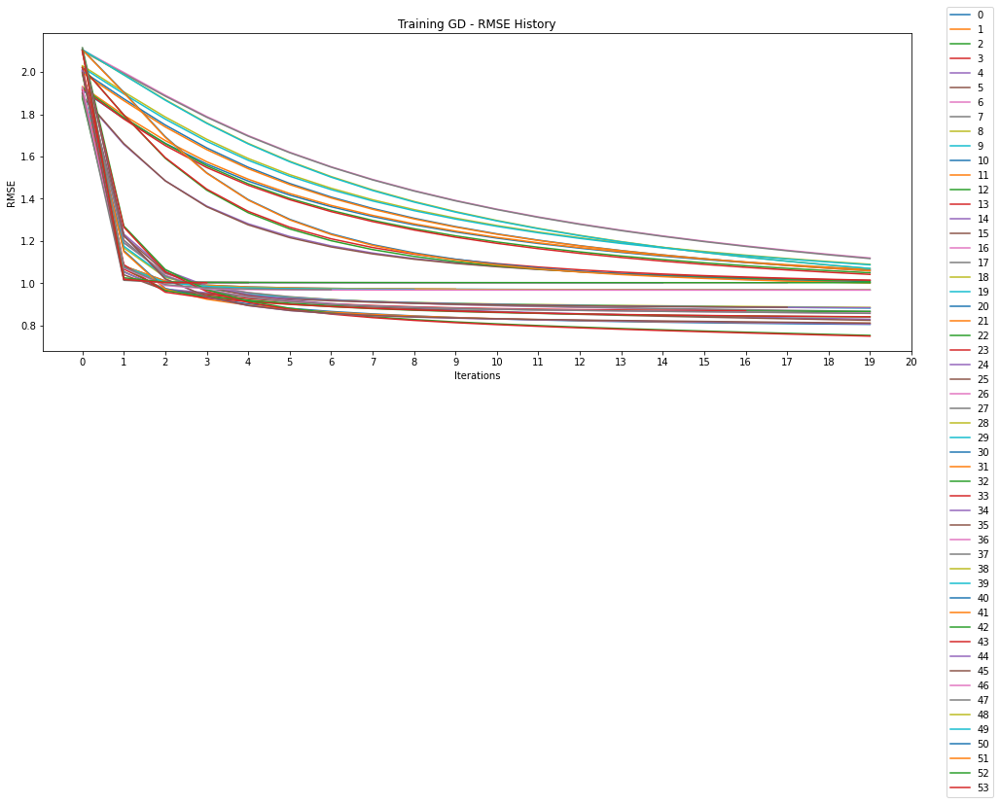

In [31]:
lines = results.History

plt.figure(figsize=(16,6))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(lines.index,loc='upper right',bbox_to_anchor=(1.1, 1.1))
plt.title('Training GD - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

**Focus on the top 3:**

In [32]:
results.loc[results.RMSE.nsmallest(3).index,:]

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
8,5,20,0.01000,0.10000,0.00001,0.97293,0.73099,0.69526,0.95644,0.95179,"[1.8802927363365791, 1.1671442682108721, 1.028...",34.86814
9,5,20,0.01000,0.10000,0.00100,0.97496,0.73315,0.69755,0.95386,0.94900,"[1.9225677449963459, 1.1752587559626242, 1.032...",34.88161
27,10,20,0.01000,0.10000,0.00100,0.98991,0.69609,0.66027,0.94993,0.94501,"[2.0058754133401977, 1.2042869150870148, 1.034...",35.05581


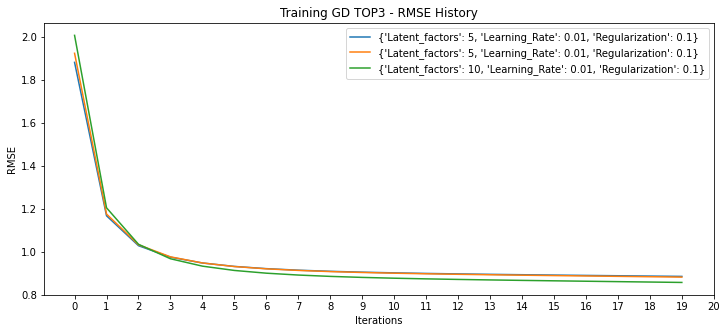

In [33]:
lines = lines[results.RMSE.nsmallest(3).index]
plt.figure(figsize=(12,5))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))

leg = (results.loc[results.RMSE.nsmallest(3).index,['Latent_factors','Learning_Rate','Regularization']]).T.to_dict().values()
plt.xticks(np.arange(n_iterations[0]+1))
plt.title('Training GD TOP3 - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend(leg)
plt.show();

## We noticed that the learning rate in the top 3 hyperparameters combinations is 0.01.

**So, lets make this more interesting and add adaptive learning rate and see what happens**

We'll choose Time based decay: 
this method reduces the learning rate every iteration according to the following formula:
$$\alpha = \frac{\alpha_{0}}{1+D\cdot t}$$
Where $\alpha_{0}$ is the original best learning rate we found -> 0.01, $D$ is a decay factor and $t$ is the current iteration.
Furthermore lets try to make the model train even faster and pick regularization between the best one found above , 0.1 and the fastest regularizaton , 1.

In [34]:
results_adpt = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'])
for n_iter in n_iterations:
    for lf in latent_factors:
        for reg in [0.1,1]:
            for d in [0.255,0.35]:
                    dic = {'Iterations':n_iter,'Latent_factors':lf,'Learning_Rate':'Adaptive','Regularization':reg,'Convergence':0.001}

                    # initialize model
                    mf = MF(train.values,n_factors=lf)
                    
                    # record training time
                    start = time.time()
                    
                    # train MF
                    mf.fit(n_iterations=n_iter,learning_rate=0.01,regularization=reg,convergence=0.001,verbose=False,D=d)
                    
                    # record traning time
                    dic['Time'] = time.time() - start
                    
                    # eval model
                    # please use the model evaluation funcntions 
                    'RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'
                    dic['RMSE'] = mf.get_rmse(test) 
                    dic['MRR_5'] = mf.get_mrr(test,k=5) 
                    dic['MRR_10'] = mf.get_mrr(test,k=10) 
                    dic['NDCG_5'] = mf.get_ndcg(test,k=5)
                    dic['NDCG_10'] = mf.get_ndcg(test,k=10)
                
                    # record model history
                    dic['History'] = mf.history # model 
                    
                    # add experiment
                    results_adpt = results_adpt.append(dic,ignore_index=True)
results_adpt

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
0,5,20,Adaptive,0.10000,0.00100,1.00313,0.69949,0.65822,0.94830,0.94375,"[1.9337630758375715, 1.1718654552294103, 1.047...",35.24705
1,5,20,Adaptive,0.10000,0.00100,1.01076,0.69681,0.64901,0.94912,0.94380,"[1.9217470383422453, 1.188139629447435, 1.0620...",34.90952
2,5,20,Adaptive,1.00000,0.00100,1.01860,0.70815,0.67250,0.95153,0.94670,"[1.9047920083431522, 1.0761839824965171, 1.016...",18.39771
3,5,20,Adaptive,1.00000,0.00100,1.01974,0.71729,0.67970,0.95100,0.94609,"[1.895960122491016, 1.080015236060447, 1.01818...",18.45676
4,10,20,Adaptive,0.10000,0.00100,1.03332,0.65956,0.61785,0.93994,0.93626,"[2.0218379431782187, 1.1962779220766848, 1.051...",34.80234
5,10,20,Adaptive,0.10000,0.00100,1.04076,0.66281,0.62567,0.94064,0.93575,"[2.0014350357983846, 1.198781046097046, 1.0604...",35.05744
6,10,20,Adaptive,1.00000,0.00100,1.02519,0.71088,0.67400,0.95277,0.94766,"[1.990168144891459, 1.079479463547787, 1.01104...",16.30762
7,10,20,Adaptive,1.00000,0.00100,1.02303,0.71196,0.66794,0.95163,0.94626,"[2.025796221125105, 1.0813024398682762, 1.0146...",18.38516
8,20,20,Adaptive,0.10000,0.00100,1.07577,0.68651,0.61081,0.93976,0.93153,"[2.103883915821694, 1.2326598522792405, 1.0514...",34.92028
9,20,20,Adaptive,0.10000,0.00100,1.09898,0.68212,0.59352,0.93316,0.92492,"[2.0992574067383023, 1.2322617395001632, 1.059...",34.96540


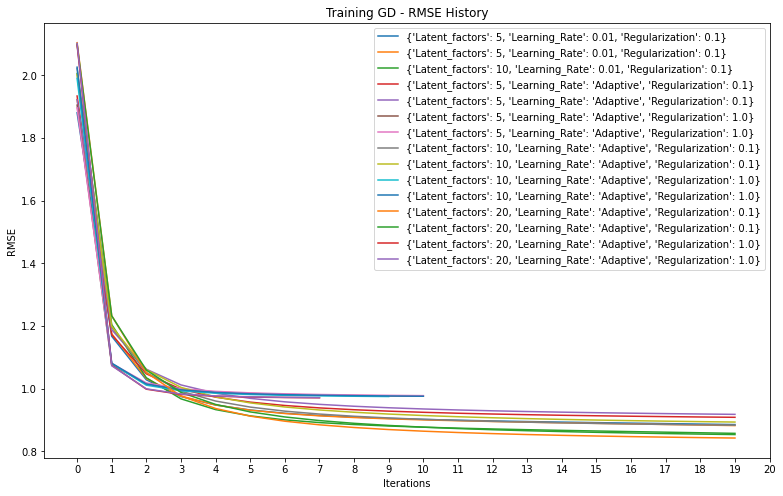

In [35]:
lst = results.History[results.RMSE.nsmallest(3).index]
lst = lst.append(results_adpt.History)
plt.figure(figsize=(13,8))
for l in lst:
    plt.plot(l)
leg = pd.concat([results.loc[results.RMSE.nsmallest(3).index,['Latent_factors','Learning_Rate','Regularization']].reset_index(drop = True),
           results_adpt[['Latent_factors','Learning_Rate','Regularization']]]).reset_index(drop = True).T.to_dict().values()
plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(leg)
plt.title('Training GD - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();


### Q: is there a clear winner?  

In [36]:
adapt_n_regular = pd.concat([results.loc[results.RMSE.nsmallest(3).index,:],results_adpt]).reset_index(drop = True)
adapt_n_regular

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
0,5,20,0.01000,0.10000,0.00001,0.97293,0.73099,0.69526,0.95644,0.95179,"[1.8802927363365791, 1.1671442682108721, 1.028...",34.86814
1,5,20,0.01000,0.10000,0.00100,0.97496,0.73315,0.69755,0.95386,0.94900,"[1.9225677449963459, 1.1752587559626242, 1.032...",34.88161
2,10,20,0.01000,0.10000,0.00100,0.98991,0.69609,0.66027,0.94993,0.94501,"[2.0058754133401977, 1.2042869150870148, 1.034...",35.05581
3,5,20,Adaptive,0.10000,0.00100,1.00313,0.69949,0.65822,0.94830,0.94375,"[1.9337630758375715, 1.1718654552294103, 1.047...",35.24705
4,5,20,Adaptive,0.10000,0.00100,1.01076,0.69681,0.64901,0.94912,0.94380,"[1.9217470383422453, 1.188139629447435, 1.0620...",34.90952
5,5,20,Adaptive,1.00000,0.00100,1.01860,0.70815,0.67250,0.95153,0.94670,"[1.9047920083431522, 1.0761839824965171, 1.016...",18.39771
6,5,20,Adaptive,1.00000,0.00100,1.01974,0.71729,0.67970,0.95100,0.94609,"[1.895960122491016, 1.080015236060447, 1.01818...",18.45676
7,10,20,Adaptive,0.10000,0.00100,1.03332,0.65956,0.61785,0.93994,0.93626,"[2.0218379431782187, 1.1962779220766848, 1.051...",34.80234
8,10,20,Adaptive,0.10000,0.00100,1.04076,0.66281,0.62567,0.94064,0.93575,"[2.0014350357983846, 1.198781046097046, 1.0604...",35.05744
9,10,20,Adaptive,1.00000,0.00100,1.02519,0.71088,0.67400,0.95277,0.94766,"[1.990168144891459, 1.079479463547787, 1.01104...",16.30762


**its Notable that there is no definitive winner. all of the combinations yielded same magnitude of results in all of the evaluation matrics. <br>we tried to add an adaptive learning rate in order to create a clear cut for a definitive winner.
<br> nevertheless, after many experiments, the best we could get with adaptive learning rate is to accelerate the running time and decrease the train RMSE(which implies overfitting because the RMSE of the test didnt improve that good correspondly).
<br>So in that manner, we'll of course choose the hyperparameters which yielded the lowest RMSE of the test, but its not that definitive and clear that it is the best model.**

Please add your winner to `final_results` dataframe.

In [37]:
bestMF_GD =adapt_n_regular.loc[adapt_n_regular.RMSE.nsmallest(1).index,:][['Time','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10']]
bestMF_GD['Method'] = f"MF: lf of {adapt_n_regular.loc[adapt_n_regular.RMSE.nsmallest(1).index,:].values[0][0]}"
final_results = final_results.append(bestMF_GD)
final_results

,Method,Time,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
0,Popularity,0.02198,1.13966,0.94928,0.92681,0.99238,0.98831
0,MF: lf of 5,34.86814,0.97293,0.73099,0.69526,0.95644,0.95179


**Understanding The Effect - `Latent Factors` - Your Conclusions:**

Due to the large sparsity of the ratings matrix, this latent vectors magic is so cool and with some mathematical "magic" its allows to split such a big sparse matrix to a lighter and dense two matrices.<br><br>
So, according to those affects, we would asprie to decrease those two matrices into the smallest we can, hence picking small Latent factors.<br><br>
The problem arises is that we risk in underfitting if we pick two small latent factors, but on the other hand we gain good computability as the latent factors decrease.<br><br>
furthermore, we witness divergence for large number of latent factors ,hence increasing it to big extend can cause to overshoot in gradient descent (although the divergence was part of specific permutation).<br><br>
So to sum up, we want small number of latent factors, but not too small, so we can gain good generalization and good computability.


**Understanding The Effect - `Learning Rate` - Your Conclusions:**


The main problem with learning rate is that when the rate is too small, the model "learns" slower thus the running time can drastically increase.<br> nevertheless, small rates can avoid overshooting the descent in GD and thus avoid divergence (still doesnt guarantee global minima).
As we increase the learning rate we witness in faster learning process but at the risk of GD diverging.<br><br>
We tried adding an adaptive learning rate for the best tuned hyperparameters in order to try and speed up the learning, plus trying to achieve better RMSE to the test. we tried to "enjoy both worlds" and ended up in a little bit overfitting on RMSE train, and not drastically increasing the running time. we tried of course different combinations of hyperparameters with adaptive learning rate, and we did acheive quick convergence, mainly with $\lambda = 1 $, but in cost of RMSE test score which was not as good as the optimum we found.

**Understanding The Effect - `Regularization` - Your Conclusions:**

Using regularization can save us from overfitting the user and item vectors by increasing the λ which  is the tuning parameter that decides how much we want to penalize the flexibility of our model, which is also multiplied by the weights which are learned in the model.<br><br>
furthermore, increasing the λ and the weights can dispute the regularization and thus ruin the purpose of the regularization which is avoid more complex model, by just diverging due to too large weights and λ.


<br><br><br>

# Bias only based model
#### Do exacly the same for BiasModel, and use the same visualizations!

<br>

**Hyperparams search + train the model :**

In [38]:
n_iterations   = [20] # just one value due to computational power
convergence    = [1e-5,1e-3]  
latent_factors = [5, 10, 20]
regularization = [0.01, 0.1, 1]
learning_rate  = [0.001, 0.01, 0.1]

results_bias = pd.DataFrame(columns=['Latent_factors','Iterations','Learning_Rate','Regularization','Convergence','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'])

for n_iter in n_iterations:
    for lf in latent_factors:
        for lr in learning_rate:
            for reg in regularization:
                for conv in convergence:

                    dic = {'Iterations':n_iter,'Latent_factors':lf,'Learning_Rate':lr,'Regularization':reg,'Convergence':conv}

                    # initialize model
                    mf = MF(train.values,n_factors=lf,only_bias=True) #ONLY BIAS IS TRUE HENCE calculating only the biases
                    
                    # record training time
                    start = time.time()
                    
                    # train MF
                    mf.fit(n_iterations=n_iter,learning_rate=lr,regularization=reg,convergence=conv,verbose=False,)
                    # mf.train(n_iterations=n_iter,verbose=False,optim='GD',learning_rate=lr,regularization=reg,convergence=conv)
                    
                    # record traning time
                    dic['Time'] = time.time() - start
                    
                    # eval model
                    # please use the model evaluation funcntions 
                    'RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10','History','Time'
                    dic['RMSE'] = mf.get_rmse(test) 
                    dic['MRR_5'] = mf.get_mrr(test,k=5) 
                    dic['MRR_10'] = mf.get_mrr(test,k=10) 
                    dic['NDCG_5'] = mf.get_ndcg(test,k=5)
                    dic['NDCG_10'] = mf.get_ndcg(test,k=10)
                
                    # record model history
                    dic['History'] = mf.history # model 
                    
                    # add experiment
                    results_bias = results_bias.append(dic,ignore_index=True)

results_bias

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
0,5,20,0.00100,0.01000,0.00001,1.06330,0.70396,0.66326,0.94375,0.93906,"[1.6325907094736063, 1.5276672651425276, 1.440...",19.64896
1,5,20,0.00100,0.01000,0.00100,1.07746,0.70591,0.65533,0.94436,0.93883,"[1.6394204484263293, 1.5391037198395952, 1.453...",19.28537
2,5,20,0.00100,0.10000,0.00001,1.06187,0.68817,0.64313,0.94194,0.93785,"[1.6385858473293107, 1.5257112604053276, 1.432...",19.52098
3,5,20,0.00100,0.10000,0.00100,1.06376,0.70004,0.65236,0.94649,0.94006,"[1.603753243290977, 1.4951748973254047, 1.4071...",19.20707
4,5,20,0.00100,1.00000,0.00001,1.06000,0.66536,0.62565,0.93804,0.93477,"[1.6351757392093722, 1.4665839102592975, 1.348...",19.74235
5,5,20,0.00100,1.00000,0.00100,1.05924,0.66929,0.62362,0.94076,0.93582,"[1.6433985751262679, 1.4648724257836085, 1.342...",19.89471
6,5,20,0.01000,0.01000,0.00001,0.95926,0.75198,0.72381,0.96042,0.95515,"[1.621328174671508, 1.121544868981522, 1.01820...",19.41110
7,5,20,0.01000,0.01000,0.00100,0.96309,0.74150,0.71053,0.95862,0.95357,"[1.6306395449329343, 1.1250584353821969, 1.020...",13.63672
8,5,20,0.01000,0.10000,0.00001,0.96176,0.74319,0.70603,0.95863,0.95343,"[1.6494623117841627, 1.1176490562876191, 1.014...",19.24221
9,5,20,0.01000,0.10000,0.00100,0.96332,0.73911,0.70650,0.95860,0.95330,"[1.6361154964480016, 1.108441271536454, 1.0123...",13.39991


**Choose your top3 models:**


In [39]:
results_bias.loc[results_bias.RMSE.nsmallest(3).index,:]

,Latent_factors,Iterations,Learning_Rate,Regularization,Convergence,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,History,Time
6,5,20,0.01000,0.01000,0.00001,0.95926,0.75198,0.72381,0.96042,0.95515,"[1.621328174671508, 1.121544868981522, 1.01820...",19.41110
24,10,20,0.01000,0.01000,0.00001,0.95952,0.75751,0.72628,0.96117,0.95566,"[1.62857182382527, 1.1199481331458663, 1.01592...",19.19897
44,20,20,0.01000,0.10000,0.00001,0.96018,0.74974,0.71460,0.95952,0.95482,"[1.6506716513535198, 1.1148078386373232, 1.012...",19.60171


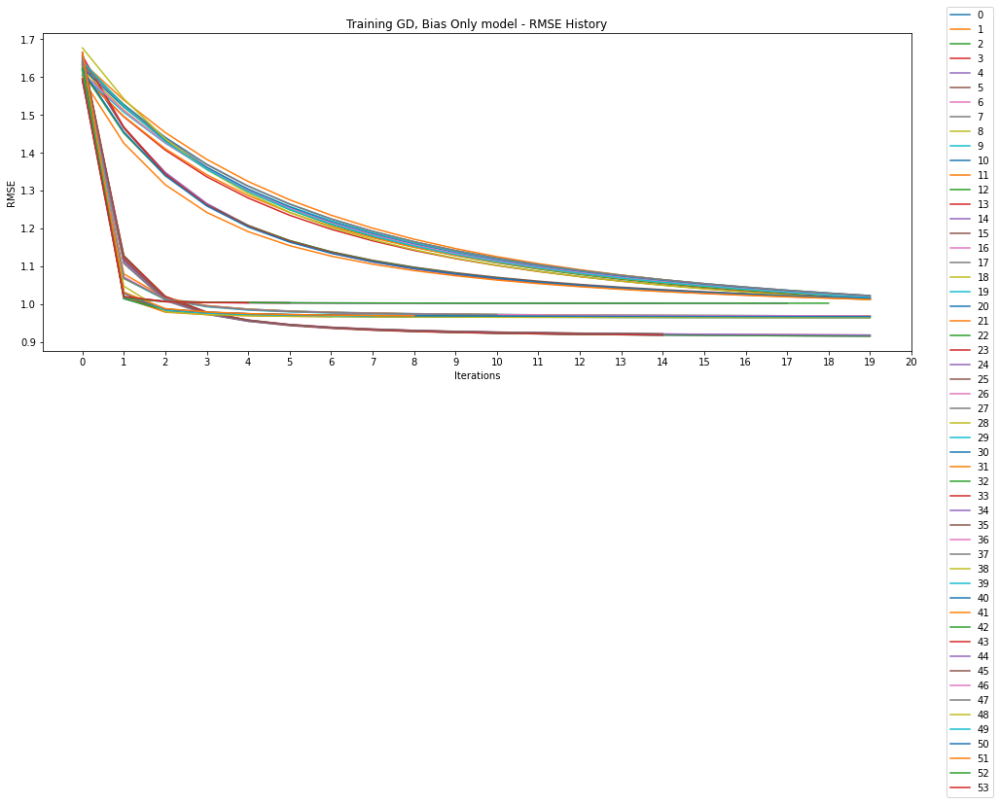

In [40]:
lines = results_bias.History

plt.figure(figsize=(16,6))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))
plt.legend(lines.index,loc='upper right',bbox_to_anchor=(1.1, 1.1))
plt.title('Training GD, Bias Only model - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.show();

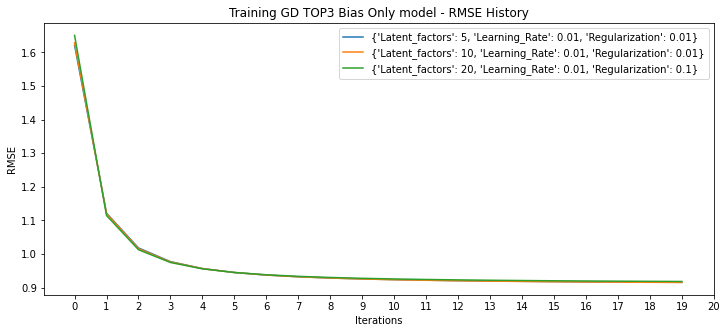

In [41]:
lines = lines[results_bias.RMSE.nsmallest(3).index]
plt.figure(figsize=(12,5))

for l in lines:
    plt.plot(l)

plt.xticks(np.arange(n_iterations[0]+1))

leg = (results_bias.loc[results_bias.RMSE.nsmallest(3).index,['Latent_factors','Learning_Rate','Regularization']]).T.to_dict().values()
plt.xticks(np.arange(n_iterations[0]+1))
plt.title('Training GD TOP3 Bias Only model - RMSE History')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.legend(leg)
plt.show();

**Add your winner to `final_resuls` dataframe:**

In [42]:
bestMF_bias =results_bias.loc[results_bias.RMSE.nsmallest(1).index,:][['Time','RMSE','MRR_5','MRR_10','NDCG_5','NDCG_10']]
bestMF_bias['Method'] = "MF_Bias_Only"
final_results = final_results.append(bestMF_bias)
final_results

,Method,Time,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10
0,Popularity,0.02198,1.13966,0.94928,0.92681,0.99238,0.98831
0,MF: lf of 5,34.86814,0.97293,0.73099,0.69526,0.95644,0.95179
6,MF_Bias_Only,19.41110,0.95926,0.75198,0.72381,0.96042,0.95515


In [43]:
final_copy = final_results.copy()

<br><br>
**Understand `with-Bias` VS `without-Bias` - Your Conclusions:**  


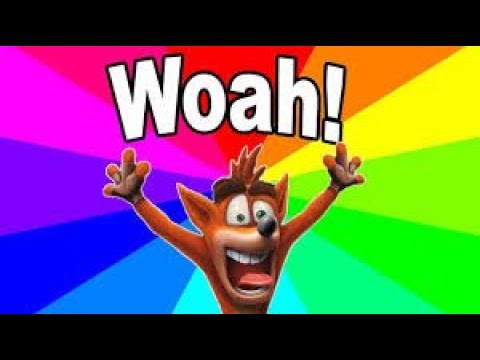

**Suprinigly enough,**<br> the bias only model yielded really great results with better execution time. all the evaluation metrics yielded terrific results and its alot easier to train.<br> we could not imagine that using bias only could achieve even slightly better results than the latent vectors.<br>
Still, the magnitude of performance is almost the same between the basic MF GD and the bias only, so its still doesnt imply that the classical MF model shouldnt be used over the bias only ,and each case is special, and depends how robust we want our model and which resources are at hand (training on cheap local machine VS AWS machines for instance).<br>
To sum up, the bias only model can give us great tool, less expensive than classical MF with latent vectors in terms of computational power and time , but still with pretty good performances. 

<br><br><br><br><br><br><br><br><br>

#### Different Methods - Conclude Final Results 

<br><br>

In [44]:
final_results_c = final_results.copy()

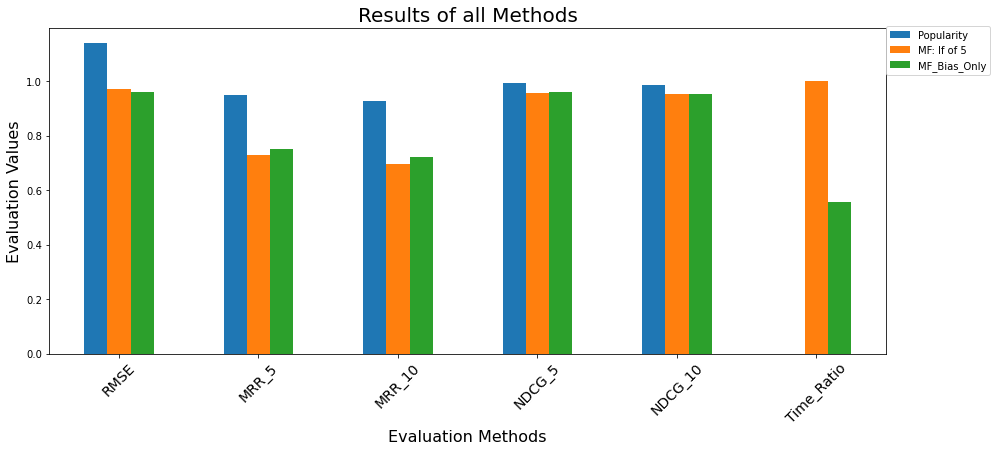

,RMSE,MRR_5,MRR_10,NDCG_5,NDCG_10,Time_Ratio
Method,,,,,,
Popularity,1.13966,0.94928,0.92681,0.99238,0.98831,0.00063
MF: lf of 5,0.97293,0.73099,0.69526,0.95644,0.95179,1.00000
MF_Bias_Only,0.95926,0.75198,0.72381,0.96042,0.95515,0.55670


In [45]:
final_results = final_results.set_index('Method')
final_results['Time_Ratio'] = final_results['Time']/final_results['Time'].max()
final_results.drop(columns = ['Time'],inplace = True)
final_results.T.plot(kind="bar", figsize=(15,6))
plt.title("Results of all Methods", fontsize=20)
plt.xlabel("Evaluation Methods", fontsize=16)
plt.ylabel("Evaluation Values", fontsize=16)
plt.xticks(fontsize=14, rotation=45)
plt.legend(loc='upper right',bbox_to_anchor=(1.13, 1.02))
plt.show();
final_results

<br><br><br><br><br><br><br>

# Question 5:
# Final Thoughts 

**Describe your challenges and findings, including comparison between the algorithms as well as your recommendations for how to select the latent factor dimension, the contribution of regularization and pros\cons of the different algorithms.**

**In your comparison refer to the evaluation metrics, training and inference duration, learning convergence and additional aspects you find relevant.**

`popularity bias:` Please refers to system recommends the movies with the most interactions without any personalization

`item cold-start problem:` Please refers to when movies added to the catalogue have either none or very little interactions while recommender rely on the movie’s interactions to make recommendations

`scalability issue:` Please refers to lack of the ability to scale to much larger sets of data when more and more users and movies added into our database

## <u>Final Thoughts:</u> 
<u>Popularity model:</u><br>
really basic and nice model, easy to understand and to implement and really really fast running time. <br> personally i like the fact that you can have a 'baseline' model which you can always compare to, and not just creating some sophisticated model without showing comparisons to some baseline.<br>
major problem of this model is that its too simplistic, by just showing the most trending items. Nowdays this model wont 'fly' and can yield ridiculous results like for example recommending 'slime' to a 60 yr old, just because by average its a trend now (or actually it was?).

<u>Cold start problem:</u><br>
The cold start problem occurs when the system is unable to form any relation between users and items for which it has insufficient data due to the fact the items or the users are new. this is a great challenge for collaborative filtering.
Traditionally, this problem is tackled by creating additional interview process to establish the item profile before making any recommendations.
This is the main reason we are using the matrix factorization technique! in general, the MF depicts user-item interactions as the product of two rectangular matrices whose content is learnt using known interactions with some machine learnig model,  Gradient descent in our case, but can be learnt with ALS also, as discussed in class. the user and the items are linked by the latent factors. when a new item is added, there are no related latent factors and the lack of interactions prevents them from being learned, as was done with previous items. so if each a prior information is given on each item as for example, several genres, we can create some mapping function which by giving the prior information about the item, can estimate the corresponding item latent factor.<br>

<u>Scalability issue:</u><br> 
The problem with the recommending system is that when each user and each movie are added to the system, the sparsity of the matrix keeps increasing more and more, hence to learning process will become more and more difficult due to enormous (and growing) size of matrix which keeps devour memory as it grows. this is why the MF method is so important because it deals with the large sparsity of the recommanding system. by using prior knowledge on the user preferences, we can also use some mapping function to estime its latent factors and not add a new sparse row to a already condensed sparse rating matrix and to overcome the scalability problem

<u>General thoughts:</u><br> 
* The matrix factorization method is a really really cool method which using pure math in order to represent some latent dimension of the users and items and interact between them. the latent vectors can represend correlating features such like genres of items which a user tends to like. so in such case, the more latent factors( genres) we have in our model, the better the recommendation should fit for the user. but there is a strong conflict between wanting to express the model as better as we can with more latent vectors (genres) and on the other hand, assigning as small size of latent vectors as we can in order to gain good computibility and running time. so, like in real life, its always somewhere in the middle so we might want to compress the latent vectors, but not as much as we can because we will end up overfitting, where in model operation we'll end up with bad results due to small number of latent vectors.<br><br>
* The bias only MF model really shocked us because it presented high performance on one hand and really good running time and easy implementation on the other hand. it is really a good model to start with, but we wouldnt recommend on giving up on learning the vectors because learning bias only might affect the generalization error, and perform worse in 'real time' as opposed to full learning process which should generalize better.<br><br>
* If we had more time, we would definitiely use validation set in order to decrease the overfitting and tune the hyperparameters even better. more over, we would try and implement mini - batch GD and try to compare results with the classical GD.<br> furthermore, we would also like to learn the MF latent factors with ALS and compare the results with the GD and see the difference and which one yielded better results on the movielens dataset.
* the mrr and ndcg metrics both demand sorting, and iam afraid that at large scales, it might detirior the robustness of quick evaluation on really large scale. nevertheless, checking the top 5 or 10 items is really a good idea and really straighforward , in the means of "check the most relevent items only".<br><br>
* we tried to use an adaptive learning rate to achieve better parameters, but the specifc method we used didnt yield that much of a difference. if we had more time, we'd difinitely try another methods for adaptive learning rate with different decay factors. we saw that large regularization and LR values can really speed up the learning but on the other hand we witnessed how to GD diverged thanks to the permutation of large hyperparameters.

#### MRR VS nDCG

**MRR**  
**Pros:**

1.  This method is simple to compute and is easy to interpret.

2. This method puts a high focus on the first relevant element of the list. 
   It is best suited for targeted searches such as users asking for the “best item for me”.

3. Good for known-item search such as navigational queries or looking for a fact.

**Cons:**   

1. The MRR metric does not evaluate the rest of the list of recommended items. 
   It focuses on a single item from the list.

2. It gives a list with a single relevant item just a much weight as a list with many relevant items. 
   It is fine if that is the target of the evaluation.

3. This might not be a good evaluation metric for users that want a list of related items to browse. 
   The goal of the users might be to compare multiple related items.


**NDCG**  
**Pros:**  

1. The primary advantage of the NDCG is that it takes into account the graded relevance values. 
   When they are available in the dataset, the NDCG is a good fit.

2. Compared to the MAP metric it does a good job at evaluating the position of ranked items. 
   It operates beyond the binary relevant/non-relevant scenario.

3. The smooth logarithmic discounting factor has a good theoretical basis discussed here. 
   The NDCG metric is consistently able to determine the better one.

**Cons:**  
    
1. The NDCG has some issues with partial feedback. This happens when we have incomplete ratings. 
   This is case for the majority of recommender systems situations. 
   If we had complete ratings there would be no real task to achieve! In this case, the recsys system owner needs to decide how to impute the missing ratings. 
   Setting the missing values to 0 would mark them as irrelevant items. 

2. We had to manually handle the case where the IDCG is equal to zero. 
   This occurs when users have no relevant documents. 

<br><br><br><br>

# Question 6: 
## Similarity & Explainability 

**Find similarity between items and demonstrate the approach on a set of 3 item triplets of your choice based on item representation by your one of your top3 matrix factorization model.**
  
**Leverage the items side information available in the dataset to demonstrate the effectiveness of the suggested approach.**

In [46]:
model = MF(train.values,n_factors=5)
model.fit(n_iterations=20,learning_rate=0.01,regularization=0.1,convergence=0.001,verbose=False)

**Known methods to find similarity between items are:**
- Pearson Corellation  
- Cosine Similarity 
- Mean Difference
- L2 Distance

**Please implement them using numpy package:** 
(for example: np.linalg)


In [47]:
def get_item2vec(mf,i):

    return mf.recommended.loc[:,i]

def get_pearson_similarity(a,b):

    a_avg, b_avg = np.average(a), np.average(b)
    a_stdev, b_stdev = np.std(a), np.std(b)
    n = len(a)
    numerator = np.sum(np.multiply(a-a_avg, b-b_avg))
    denominator = a_stdev * b_stdev * n
    p_coef = numerator / denominator

    return p_coef

def get_cosine_similarity(a,b):

    return np.dot(a, b)/(np.linalg.norm(a)*np.linalg.norm(b))

def get_mean_diff_similarity(a1,a2):
    
    return np.mean(np.abs(a1 - a2))

def get_l2_similarity(a1,a2):

    return np.linalg.norm(a1- a2)


We wil choose pearson similarity

**For the next step, please choose your favorite method.**  

**Please compare 3 triplets of movies, and for each triplet create this:**   
Create a dataframe same as the example

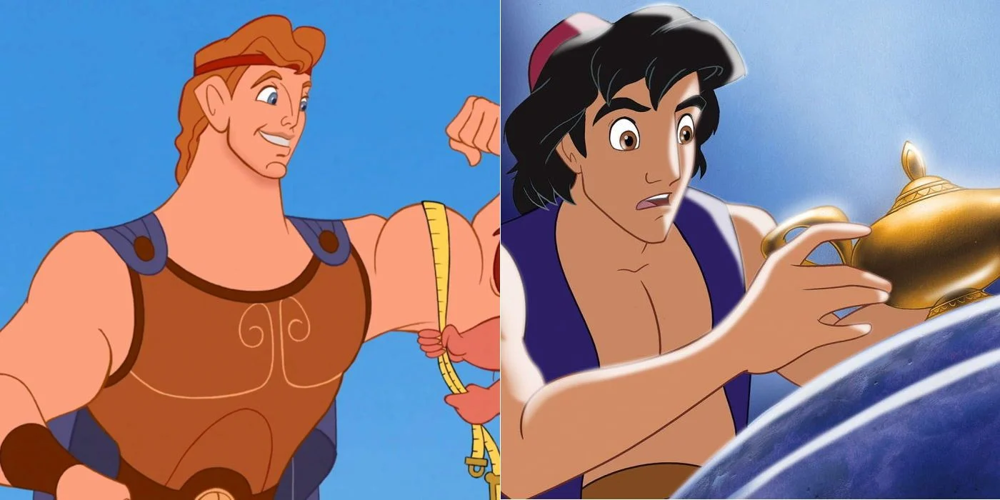

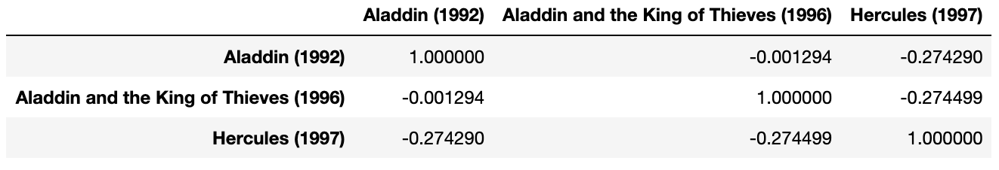

## IAM SORRY BUT IT WOULD BE A CRIME NOT TO INCLUDE ALL THE 4 BATMANS!! 
my conscious wont allow it<b><br><br>
**First Quadruple: BATMAN!**

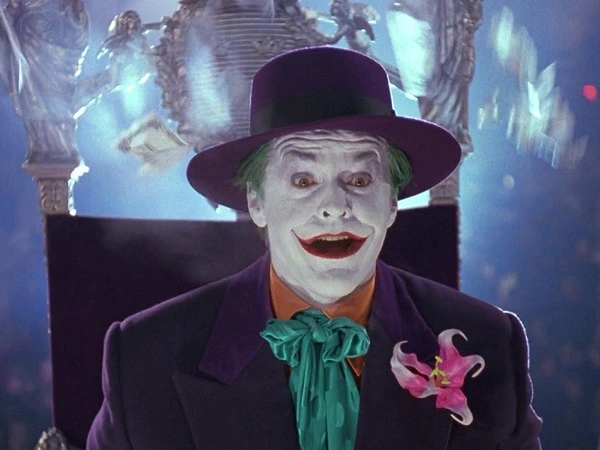 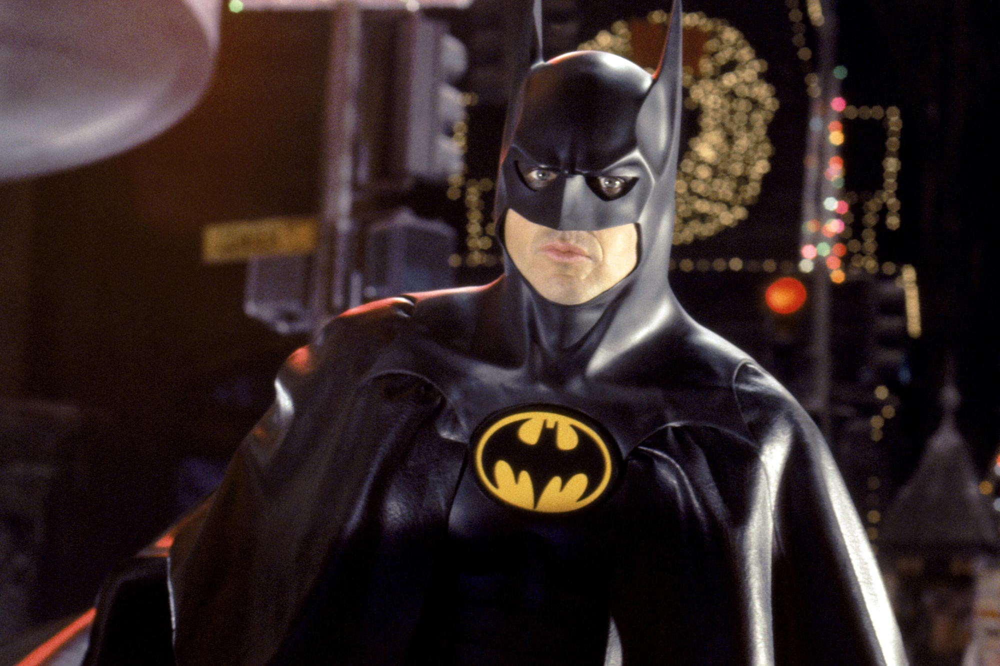

29 |  Batman Forever (1995) <br><br>
231|  Batman Returns (1992) <br><br>
254|  Batman & Robin (1997) <br><br>
403|  Batman (1989)

In [48]:
batman = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values)
batman.iloc[0,0] = get_pearson_similarity(get_item2vec(model,231),get_item2vec(model,231))
batman.iloc[1,1] = get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,29))
batman.iloc[2,2] = get_pearson_similarity(get_item2vec(model,254),get_item2vec(model,254))
batman.iloc[3,3] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,403))
batman.iloc[0,1],batman.iloc[1,0] = get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,231))
batman.iloc[0,2],batman.iloc[2,0] = get_pearson_similarity(get_item2vec(model,254),get_item2vec(model,29)),get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,254))
batman.iloc[1,2],batman.iloc[2,1] = get_pearson_similarity(get_item2vec(model,254),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,231),get_item2vec(model,254))
batman.iloc[0,3],batman.iloc[3,0] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,29)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,29))
batman.iloc[1,3],batman.iloc[3,1] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,231))
batman.iloc[2,3],batman.iloc[3,2] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,254)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,254))
batman

,Batman Forever (1995),Batman Returns (1992),Batman & Robin (1997),Batman (1989)
Batman Forever (1995),1.00000,0.96249,0.78696,0.83654
Batman Returns (1992),0.96249,1.00000,0.70853,0.91638
Batman & Robin (1997),0.78696,0.70853,1.00000,0.66232
Batman (1989),0.83654,0.91638,0.66232,1.00000


## Look  how all the batman movies correlate really good between each other except for batman & robin. its because this movie is a disgrace to the batman films! 
if it was up to me this is how i would correlate batman & robin with itself:

In [49]:
batman = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values)
batman.iloc[0,0] = get_pearson_similarity(get_item2vec(model,231),get_item2vec(model,231))
batman.iloc[1,1] = get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,29))
batman.iloc[2,2] = "THIS MOVIE SUCKS - BOOOO"
batman.iloc[3,3] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,403))
batman.iloc[0,1],batman.iloc[1,0] = get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,231))
batman.iloc[0,2],batman.iloc[2,0] = get_pearson_similarity(get_item2vec(model,254),get_item2vec(model,29)),get_pearson_similarity(get_item2vec(model,29),get_item2vec(model,254))
batman.iloc[1,2],batman.iloc[2,1] = get_pearson_similarity(get_item2vec(model,254),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,231),get_item2vec(model,254))
batman.iloc[0,3],batman.iloc[3,0] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,29)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,29))
batman.iloc[1,3],batman.iloc[3,1] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,231)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,231))
batman.iloc[2,3],batman.iloc[3,2] = get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,254)),get_pearson_similarity(get_item2vec(model,403),get_item2vec(model,254))
# batman.style.applymap(lambda x: "background-color: red" if type(x) == type('')  else "background-color: white")
def style_specific_cell(x):

    color = 'background-color:yellow'
    df1 = pd.DataFrame('', index=x.index, columns=x.columns)
    df1.iloc[2, 2] = color
    return df1

batman.style.apply(style_specific_cell, axis=None)

,Batman Forever (1995),Batman Returns (1992),Batman & Robin (1997),Batman (1989)
Batman Forever (1995),1.000000,0.962486,0.786961,0.836538
Batman Returns (1992),0.962486,1.000000,0.708532,0.916384
Batman & Robin (1997),0.786961,0.708532,THIS MOVIE SUCKS - BOOOO,0.662316
Batman (1989),0.836538,0.916384,0.662316,1.000000


**Second Triplet: star wars trilogy**

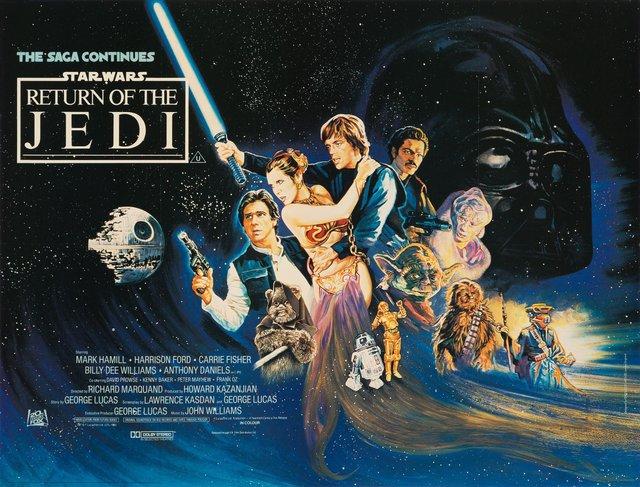

50 |  Star Wars (1977) <br><br>
172|  Empire Strikes Back, The (1980) <br><br>
181|  Return of the Jedi (1983)

In [50]:
jedi = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([50,172,181])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([50,172,181])].values)
jedi.iloc[0,0] = get_pearson_similarity(get_item2vec(model,50),get_item2vec(model,50))
jedi.iloc[1,1] = get_pearson_similarity(get_item2vec(model,172),get_item2vec(model,172))
jedi.iloc[2,2] = get_pearson_similarity(get_item2vec(model,181),get_item2vec(model,181))
jedi.iloc[0,1],jedi.iloc[1,0] = get_pearson_similarity(get_item2vec(model,50),get_item2vec(model,172)),get_pearson_similarity(get_item2vec(model,50),get_item2vec(model,172))
jedi.iloc[0,2],jedi.iloc[2,0] = get_pearson_similarity(get_item2vec(model,50),get_item2vec(model,181)),get_pearson_similarity(get_item2vec(model,50),get_item2vec(model,181))
jedi.iloc[1,2],jedi.iloc[2,1] = get_pearson_similarity(get_item2vec(model,181),get_item2vec(model,172)),get_pearson_similarity(get_item2vec(model,181),get_item2vec(model,172))
jedi

,Star Wars (1977),"Empire Strikes Back, The (1980)",Return of the Jedi (1983)
Star Wars (1977),1.00000,0.98639,0.98595
"Empire Strikes Back, The (1980)",0.98639,1.00000,0.98549
Return of the Jedi (1983),0.98595,0.98549,1.00000


 Woah! really nice results, even a little alerting and too good to be true

**Third Triplet - Jim Carrey starring**

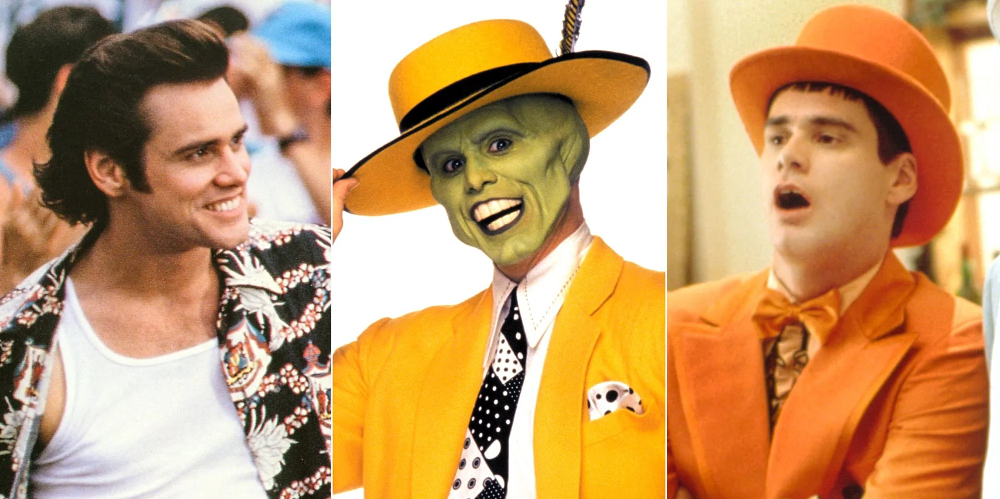

67|   Ace Ventura: Pet Detective (1994) <br><br>
72|   Mask, The (1994)| <br><br>
780|  Dumb & Dumber (1994)

In [51]:
jimcarrey = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([72,67,780])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([72,67,780])].values)
jimcarrey.iloc[0,0] = get_pearson_similarity(get_item2vec(model,67),get_item2vec(model,67))
jimcarrey.iloc[1,1] = get_pearson_similarity(get_item2vec(model,72),get_item2vec(model,72))
jimcarrey.iloc[2,2] = get_pearson_similarity(get_item2vec(model,780),get_item2vec(model,780))
jimcarrey.iloc[0,1],jimcarrey.iloc[1,0] = get_pearson_similarity(get_item2vec(model,67),get_item2vec(model,72)),get_pearson_similarity(get_item2vec(model,67),get_item2vec(model,72))
jimcarrey.iloc[0,2],jimcarrey.iloc[2,0] = get_pearson_similarity(get_item2vec(model,67),get_item2vec(model,780)),get_pearson_similarity(get_item2vec(model,67),get_item2vec(model,780))
jimcarrey.iloc[1,2],jimcarrey.iloc[2,1] = get_pearson_similarity(get_item2vec(model,72),get_item2vec(model,780)),get_pearson_similarity(get_item2vec(model,72),get_item2vec(model,780))
jimcarrey

,Ace Ventura: Pet Detective (1994),"Mask, The (1994)",Dumb & Dumber (1994)
Ace Ventura: Pet Detective (1994),1.00000,0.93211,0.55850
"Mask, The (1994)",0.93211,1.00000,0.59446
Dumb & Dumber (1994),0.55850,0.59446,1.00000


the triplet above represents jim carey nonesense movies each in his own way. while the mask and ace ventura are more imaginary and goofy, dumb and dumber is only goofy and dumb. but yet we expected to see better correlation between dumb & dumber and to the rest of the films because all are under the 'nonesense' category. maybe if we tried less latent factors the result would be better.

# BUT! We know that the movielens 100k dataset has 19 genres.
so now we want to repeat the process but with latent factor of 19 and witness any differences

In [52]:
model_19 = MF(train.values,n_factors=19)
model_19.fit(n_iterations=20,learning_rate=0.01,regularization=0.1,convergence=0.001,verbose=False)
print(f"RMSE TEST OF LF 19: {model_19.get_rmse(test)}")

RMSE TEST OF LF 19: 0.9960184122186824


**Batman:**

In [53]:
batman = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([231,29,254,403])].values)
batman.iloc[0,0] = get_pearson_similarity(get_item2vec(model_19,231),get_item2vec(model_19,231))
batman.iloc[1,1] = get_pearson_similarity(get_item2vec(model_19,29),get_item2vec(model_19,29))
batman.iloc[2,2] = get_pearson_similarity(get_item2vec(model_19,254),get_item2vec(model_19,254))
batman.iloc[3,3] = get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,403))
batman.iloc[0,1],batman.iloc[1,0] = get_pearson_similarity(get_item2vec(model_19,29),get_item2vec(model_19,231)),get_pearson_similarity(get_item2vec(model_19,29),get_item2vec(model_19,231))
batman.iloc[0,2],batman.iloc[2,0] = get_pearson_similarity(get_item2vec(model_19,254),get_item2vec(model_19,29)),get_pearson_similarity(get_item2vec(model_19,29),get_item2vec(model_19,254))
batman.iloc[1,2],batman.iloc[2,1] = get_pearson_similarity(get_item2vec(model_19,254),get_item2vec(model_19,231)),get_pearson_similarity(get_item2vec(model_19,231),get_item2vec(model_19,254))
batman.iloc[0,3],batman.iloc[3,0] = get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,29)),get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,29))
batman.iloc[1,3],batman.iloc[3,1] = get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,231)),get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,231))
batman.iloc[2,3],batman.iloc[3,2] = get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,254)),get_pearson_similarity(get_item2vec(model_19,403),get_item2vec(model_19,254))
batman

,Batman Forever (1995),Batman Returns (1992),Batman & Robin (1997),Batman (1989)
Batman Forever (1995),1.00000,0.78592,0.67942,0.74477
Batman Returns (1992),0.78592,1.00000,0.66582,0.85838
Batman & Robin (1997),0.67942,0.66582,1.00000,0.62601
Batman (1989),0.74477,0.85838,0.62601,1.00000


**Star wars**

In [54]:
jedi = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([50,172,181])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([50,172,181])].values)
jedi.iloc[0,0] = get_pearson_similarity(get_item2vec(model_19,50),get_item2vec(model_19,50))
jedi.iloc[1,1] = get_pearson_similarity(get_item2vec(model_19,172),get_item2vec(model_19,172))
jedi.iloc[2,2] = get_pearson_similarity(get_item2vec(model_19,181),get_item2vec(model_19,181))
jedi.iloc[0,1],jedi.iloc[1,0] = get_pearson_similarity(get_item2vec(model_19,50),get_item2vec(model_19,172)),get_pearson_similarity(get_item2vec(model_19,50),get_item2vec(model_19,172))
jedi.iloc[0,2],jedi.iloc[2,0] = get_pearson_similarity(get_item2vec(model_19,50),get_item2vec(model_19,181)),get_pearson_similarity(get_item2vec(model_19,50),get_item2vec(model_19,181))
jedi.iloc[1,2],jedi.iloc[2,1] = get_pearson_similarity(get_item2vec(model_19,181),get_item2vec(model_19,172)),get_pearson_similarity(get_item2vec(model_19,181),get_item2vec(model_19,172))
jedi

,Star Wars (1977),"Empire Strikes Back, The (1980)",Return of the Jedi (1983)
Star Wars (1977),1.00000,0.94425,0.91316
"Empire Strikes Back, The (1980)",0.94425,1.00000,0.91576
Return of the Jedi (1983),0.91316,0.91576,1.00000


**Jim Carrey theme**

In [55]:
jimcarrey = pd.DataFrame(columns = df_items.movie_title[df_items['movie id'].isin([72,67,780])].values, 
                      index = df_items.movie_title[df_items['movie id'].isin([72,67,780])].values)
jimcarrey.iloc[0,0] = get_pearson_similarity(get_item2vec(model_19,67),get_item2vec(model_19,67))
jimcarrey.iloc[1,1] = get_pearson_similarity(get_item2vec(model_19,72),get_item2vec(model_19,72))
jimcarrey.iloc[2,2] = get_pearson_similarity(get_item2vec(model_19,780),get_item2vec(model_19,780))
jimcarrey.iloc[0,1],jimcarrey.iloc[1,0] = get_pearson_similarity(get_item2vec(model_19,67),get_item2vec(model_19,72)),get_pearson_similarity(get_item2vec(model_19,67),get_item2vec(model_19,72))
jimcarrey.iloc[0,2],jimcarrey.iloc[2,0] = get_pearson_similarity(get_item2vec(model_19,67),get_item2vec(model_19,780)),get_pearson_similarity(get_item2vec(model_19,67),get_item2vec(model_19,780))
jimcarrey.iloc[1,2],jimcarrey.iloc[2,1] = get_pearson_similarity(get_item2vec(model_19,72),get_item2vec(model_19,780)),get_pearson_similarity(get_item2vec(model_19,72),get_item2vec(model_19,780))
jimcarrey

,Ace Ventura: Pet Detective (1994),"Mask, The (1994)",Dumb & Dumber (1994)
Ace Ventura: Pet Detective (1994),1.00000,0.77252,0.30963
"Mask, The (1994)",0.77252,1.00000,0.26071
Dumb & Dumber (1994),0.30963,0.26071,1.00000


## Conclusions:
The relativeness of results from the MF model with LF =5 to LF = 19 is saved, and we dont see any different or unusual results, except that the absolute values of the pearson correlation decreased correspondingly for each of the movies inspections, so to sum up, even though we chose the latent factor as the size of the genres, we didnt witness any other results, hence we might carefully say that even with small LF, we can still expect pretty good results

<br><br><br>
**Find two latent dimensions of your matrix factorization model and try to estimate the latent ‘meaning’ of the learnt matrix factorization model.**

**Tip:**  
would different genres I will get a good seperation?  
For example, here we can see that this is not a good seperation.
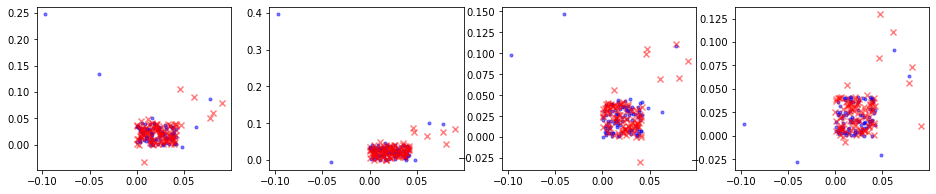



In [56]:
def plot_seperation_between_latent(model,genre_a,genre_b,latent_v: int,n_latent: list):
    fig, ax = plt.subplots(1,4,figsize=(16,4))
    j= 0
    for i in n_latent:
        vec_a = model.v_j[genre_a-1][:,[latent_v,i]]
        vec_b = model.v_j[genre_b-1][:,[latent_v,i]]
        ax[j].title.set_text(f' Latent Vector {latent_v+1}\n VS\n Latent Vector {i+1}')
        ax[j].scatter(vec_a[:,0], vec_a[:,1], marker='.',color='blue',alpha=0.5)
        ax[j].scatter(vec_b[:,0], vec_b[:,1], marker='x',color='red',alpha=0.5)
        j+=1
    plt.show()

## Comedy Vs Drama Separation

#### Lets see if we can find a clear seperation between comedy and drama in a 5 latent factor MF model:

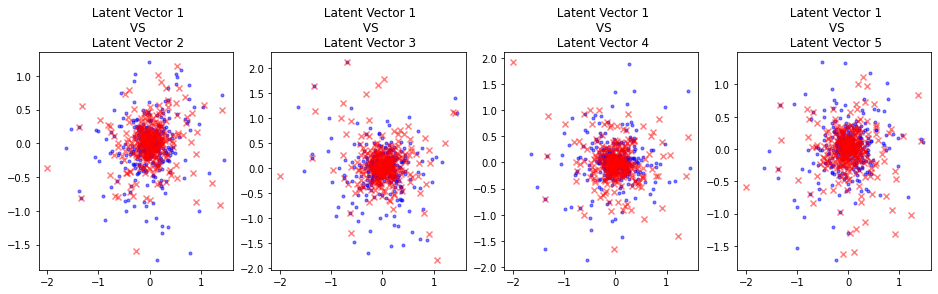

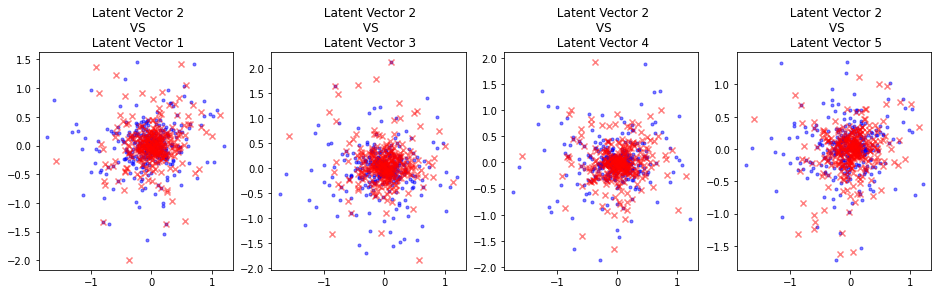

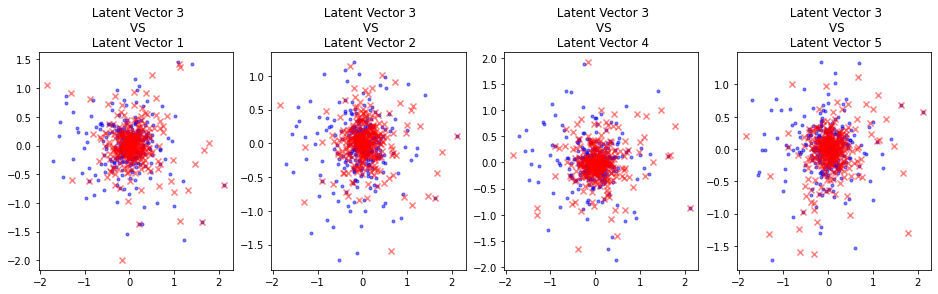

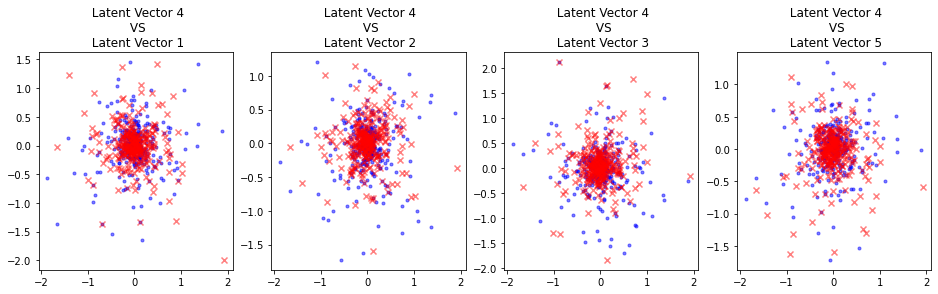

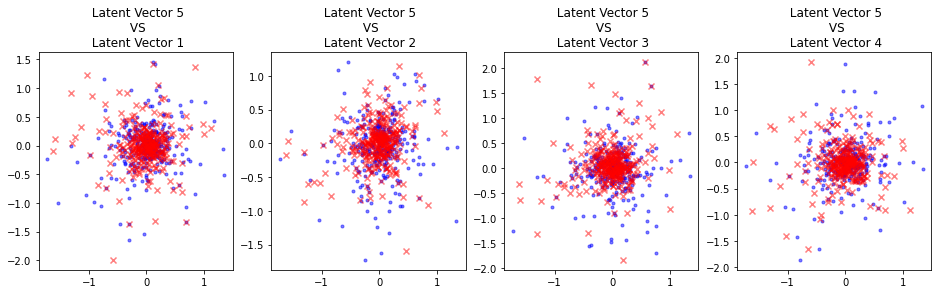

In [57]:
for i in range(5):
    latents = [0,1,2,3,4]
    latent_v = latents.pop(i)
    comedia = df_items[df_items.Comedy == 1]['movie id'][1:300] 
    drama =  df_items[df_items.Drama == 1]['movie id'][1:300]
    plot_seperation_between_latent(model,comedia,drama,latent_v,latents)

## Comdey Vs Horror Seperation

#### Lets see if we can find a clear seperation between comedy and horror in a 5 latent factor MF model:

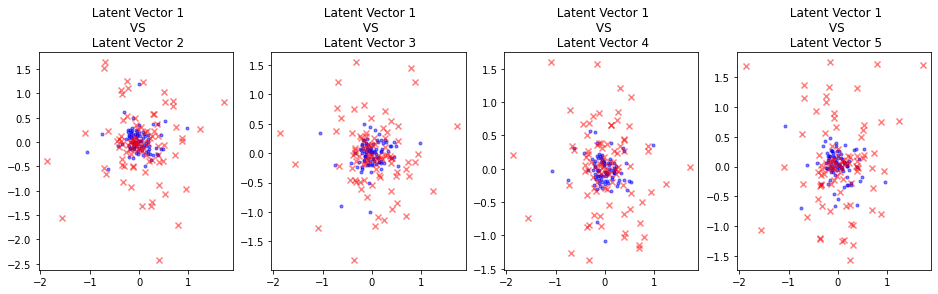

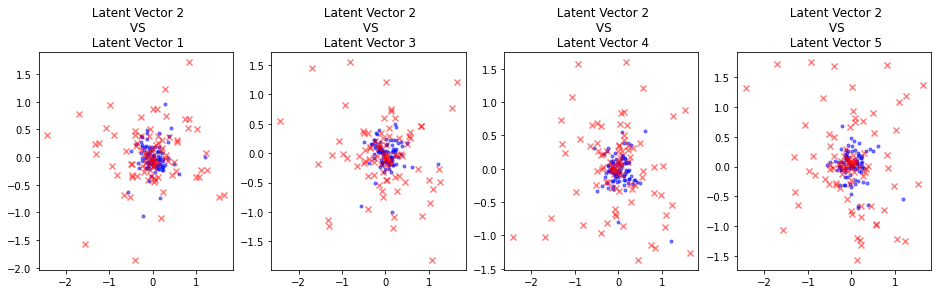

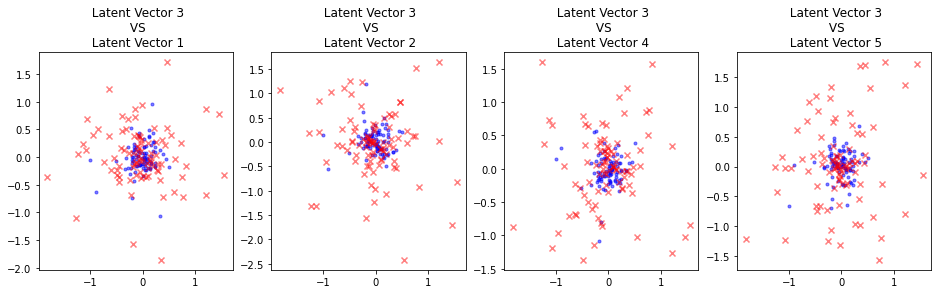

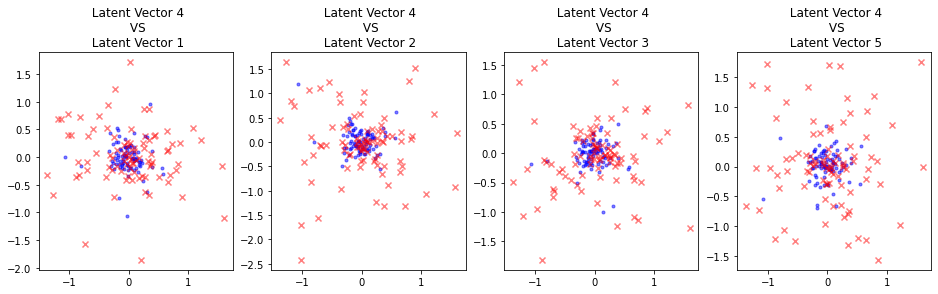

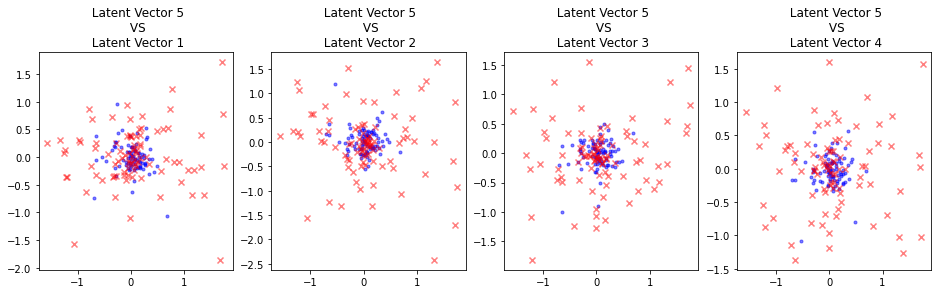

In [58]:
for i in range(5):
    latents = [0,1,2,3,4]
    latent_v = latents.pop(i)
    comedia = df_items[df_items.Comedy == 1]['movie id'][1:90] 
    horror =  df_items[df_items.Horror == 1]['movie id'][1:90]
    plot_seperation_between_latent(model,comedia,horror,latent_v,latents)

## Unfortunately there is no clear cut between  any of these genres above under any of the latent vectors permutations...
to be honset, this notebook could go on and on and there is alot to investigate and discover!<br> we found the material really interesting and fun to investigate